In [1]:
import numpy as np
from skimage import io
import cv2
import scipy.interpolate as interpolate
from scipy.signal import convolve2d
import matplotlib.pyplot as plt


In [2]:
def bilateral_filter(im_am, im_f, sigma_range=0.25, sigma_spatial=1, gaussian_k=3):

    #im1 = ambience image
    #im2 = flash image

    im1 = im_am
    im2 = im_f

    lambda1 = 0.0001
    minI = min(im2.flatten()-lambda1)
    maxI = max(im2.flatten()+lambda1)
    nb_seg = np.ceil((maxI - minI)/sigma_range)
    k = gaussian_k

    J = []
    for j in range(int(nb_seg)):
    
        ij = minI + j*(maxI - minI)/nb_seg
        Gj = np.exp(-((im2-ij)**2)/(2*sigma_range**2))
        Kj = cv2.GaussianBlur(Gj, (k,k), sigma_spatial)
    
        Hj = Gj*im1
        Hj = cv2.GaussianBlur(Hj, (k,k), sigma_spatial)
        Jj = Hj/Kj
        J.append(Jj)

    J = np.array(J)
    print(J.shape)
    J = J.transpose(1,2,0,3)
    h,w,_,_ = J.shape
    y = np.arange(0, h)
    x = np.arange(0, w)
    xx, yy = np.meshgrid(x, y)
    r = interpolate.interpn((np.arange(0,h),
                        np.arange(0,w),
                        np.arange(J.shape[2])), J[:,:,:,0], (yy, xx, im1[:,:,0]))
    g = interpolate.interpn((np.arange(0,h),
                        np.arange(0,w),
                        np.arange(J.shape[2])), J[:,:,:,1], (yy, xx, im1[:,:,1]))
    b = interpolate.interpn((np.arange(0,h),
                            np.arange(0,w),
                            np.arange(J.shape[2])), J[:,:,:,2], (yy, xx, im1[:,:,2]))
    Ji = np.stack([r,g,b], axis=2)

    Ji = (Ji-Ji.min())/(Ji.max()-Ji.min())

    return Ji

def detail_transfer(im_f, im_am):

    im_f_bf = bilateral_filter(im_f, im_f, sigma_range=0.5, sigma_spatial=1, gaussian_k=3)
    im_jbf = bilateral_filter(im_am, im_f, sigma_range=0.25, sigma_spatial=1, gaussian_k=0)

    epsi = 1e-8

    out = im_jbf*(im_f + epsi)/(im_f_bf + epsi)
    out = np.clip(out, 0, 1)
    return out

def get_mask(im_f, im_am):

    def gamma_correction(im):

        out = im.copy()
        out[np.where(out<=0.0404482)] = out[np.where(out<=0.0404482)]/12.92
        out[np.where(out>0.0404482)] = ((out[np.where(out>0.0404482)]+0.055)/1.055)**2.4

        return out
        

    F_lin = gamma_correction(im_f)
    A_lin = gamma_correction(im_am)
    
    M = np.zeros(F_lin.shape)
    M[np.where(F_lin - A_lin <= 0.85)] = 1
    return M

def masking(im_f, im_am):

    M = get_mask(im_f, im_am)
    im_detail = detail_transfer(im_f, im_am)
    im_am_bf = bilateral_filter(im_am, im_am, sigma_range=0.25, sigma_spatial=1, gaussian_k=0)

    out = im_am_bf*M + im_detail*(1-M)
    out = np.clip(out, 0, 1)
    return out, im_detail, M

In [13]:
out = bilateral_filter(im2, im2)
io.imsave('data/lamp/lamp_ambient_bf.png', out)
io.imshow(out)

(21, 2048, 3072, 3)


(5, 2048, 3072, 3)


/Users/richamishra/miniconda3/envs/CV/lib/python3.9/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [0.0, 4.552243946218739]. Convert image to uint8 prior to saving to suppress this warning.


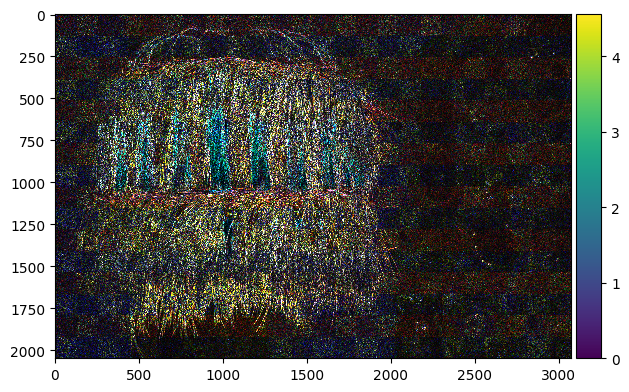

In [107]:
im1 = io.imread('data/lamp/lamp_ambient.tif')
im1 = (im1-im1.min())/(im1.max()-im1.min())
im2 = io.imread('data/lamp/lamp_flash.tif')
im2 = (im2-im2.min())/(im2.max()-im2.min())

out_jbf = bilateral_filter(im1, im2, sigma_range=0.05, sigma_spatial=1, gaussian_k=0)
#io.imsave('data/lamp/lamp_jbf_0.25_1_0.png', out_jbf)
#io.imshow(out_jbf)
#io.imshow(out_jbf)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


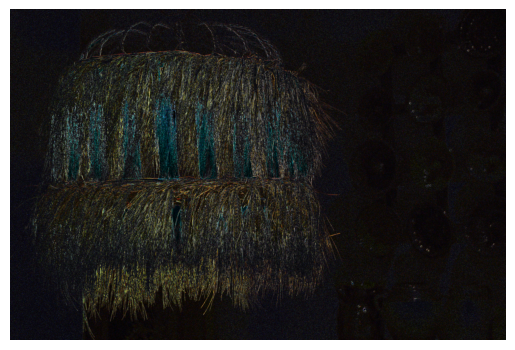

In [128]:
diff = np.abs(out_jbf-im1)*5
plt.axis('off')
plt.imshow(diff)
plt.savefig('data/lamp/lamp_bjf_diff.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

In [113]:
im_1 = io.imread('data/lamp/lamp_ambient.tif')
im_am = (im1-im1.min())/(im1.max()-im1.min())
im2 = io.imread('data/lamp/lamp_flash.tif')
im_f = (im2-im2.min())/(im2.max()-im2.min())

out_detail, = detail_transfer(im_f, im_am)
out_detail = np.clip(out_detail, 0, 1)

(3, 2048, 3072, 3)
(5, 2048, 3072, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


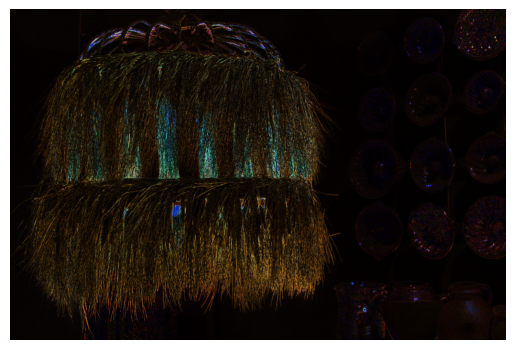

In [124]:
diff_dt = np.abs(out_detail-out_jbf)*5
plt.imshow(diff_dt)
plt.axis('off')
plt.savefig('data/lamp/lamp_detail_transfer_diff.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

In [140]:
im_1 = io.imread('data/lamp/lamp_ambient.tif')
im_am = (im1-im1.min())/(im1.max()-im1.min())
im2 = io.imread('data/lamp/lamp_flash.tif')
im_f = (im2-im2.min())/(im2.max()-im2.min())

out_detail = detail_transfer(im_f, im_am)
out_detail = np.clip(out_detail, 0, 1)

#diff_dt = np.abs()*5
#plt.imshow(diff_dt)
#plt.axis('off')
#plt.savefig('data/lamp/lamp_masking_diff.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

(3, 2048, 3072, 3)
(5, 2048, 3072, 3)


ValueError: too many values to unpack (expected 2)

(3, 2048, 3072, 3)
(5, 2048, 3072, 3)
(5, 2048, 3072, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


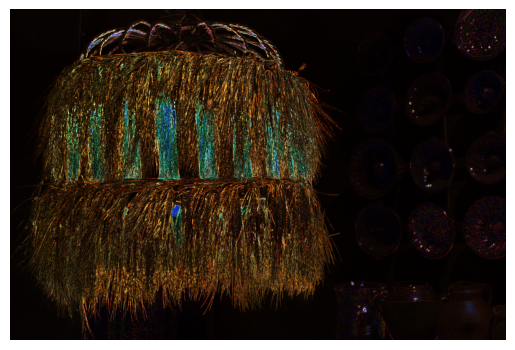

In [130]:
im_1 = io.imread('data/lamp/lamp_ambient.tif')
im_am = (im1-im1.min())/(im1.max()-im1.min())
im2 = io.imread('data/lamp/lamp_flash.tif')
im_f = (im2-im2.min())/(im2.max()-im2.min())
im_masked, M = masking(im_f, im_am)

diff_dt = np.abs(im_masked-out_detail)*5
plt.imshow(diff_dt)
plt.axis('off')
plt.savefig('data/lamp/lamp_masking_diff.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

In [141]:
M.shape

(2048, 3072, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


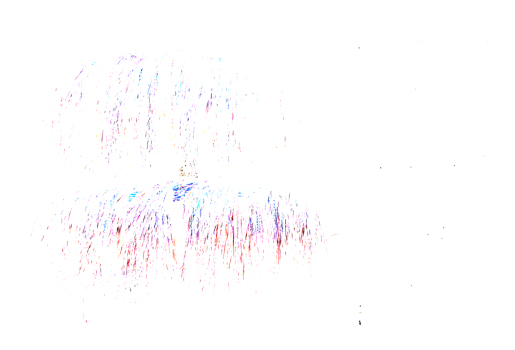

In [143]:
plt.imshow(M*100, cmap='gray')
plt.axis('off')
plt.savefig('data/lamp/mask.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

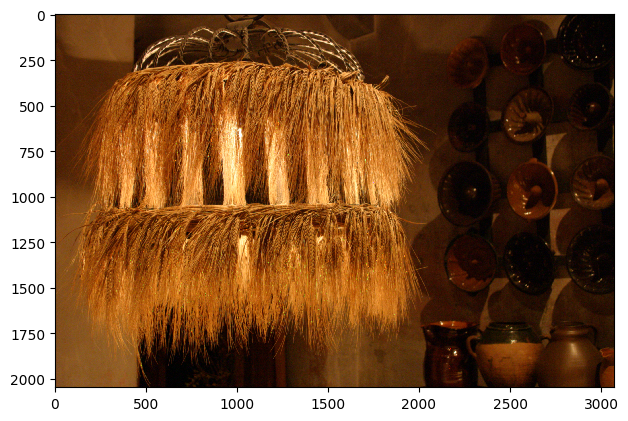

In [72]:
io.imshow(im_masked)
#io.imsave('data/lamp/lamp_masked.png', im_masked)

2. Gradient-domain processing (100 points)

In [3]:
def grad_x(im):
    imx = np.pad(im, ((0,0), (1,0)))
    gr_x = np.diff(imx, n=1, axis=1)
    return gr_x

def grad_y(im):
    imy = np.pad(im, ((1,0),(0,0)))
    gr_y = np.diff(imy, n=1, axis=0)
    return gr_y

def get_gradient(im):

    gr_x = grad_x(im)
    gr_y = grad_y(im)
    gr = np.stack([gr_x, gr_y], axis=0) #H,W,2

    return gr

def img_gradient(im):

    gx = get_gradient(im[:,:,0])
    gy = get_gradient(im[:,:,1])
    gz = get_gradient(im[:,:,2])

    out = np.stack([gx, gy, gz], axis=3) #2,H,W,3
    return out

def divergence(gradient):

    grad_x = np.pad(gradient[0, :, :], ((0, 0), (0, 1)))
    grad_xx = np.diff(grad_x, axis=1)
    grad_y = np.pad(gradient[1, :, :], ((0, 1), (0, 0)))
    grad_yy = np.diff(grad_y, axis=0)
    return grad_xx + grad_yy

def img_divergence(im):

    im_grad = img_gradient(im) #2,H,W,3
    
    div_x = divergence(im_grad[:,:,:,0])
    div_y = divergence(im_grad[:,:,:,1])
    div_z = divergence(im_grad[:,:,:,2])

    out = np.stack([div_x, div_y, div_z], axis=2)

    return out

def laplacian(img):
    lap_k = np.array([[0, 1, 0],[1, -4, 1],[0, 1, 0]])
    laplacian = convolve2d(img, lap_k, mode='same', boundary='fill', fillvalue=0)
    return laplacian

def laplacian_image(img):
    laplacian0 = laplacian(img[:, :, 0])
    laplacian1 = laplacian(img[:, :, 1])
    laplacian2 = laplacian(img[:, :, 2])
    return np.stack([laplacian0, laplacian1, laplacian2], axis=2)

In [158]:
def poisson_solver(D, img, I_star_init, EPSILON=1e-5, N=10000):

    B = np.zeros(img.shape)
    B[1:-1,1:-1,:] = 1

    I_star_boundary = np.zeros_like(img)
    I_star_boundary[1:-1,1:-1,:] = img[1:-1,1:-1,:]

    I_star = B*I_star_init + (1-B)*I_star_boundary
    r = B*(D-laplacian_image(I_star))
    d = r
    delta_new = np.sum(r*r)
    n = 0

    while(n<N and delta_new>EPSILON):
        if(n % 1000 == 0):
            print("Iteration number", n)
            print("Current residual", np.sqrt(np.sum(r * r)))
            #if n!=0:
                #io.imsave('data/test2/test3_bilateral_joint{}.png'.format(n), I_star)
            
        q = laplacian_image(d)
        alpha = delta_new/np.sum(d*q)
        I_star = I_star + alpha*(B*d)
        r = B*(r - alpha*q)
        delta_old = delta_new
        delta_new = np.sum(r*r)
        beta = delta_new/delta_old
        d = r + beta*d
        n += 1
    
    I_star = np.clip(I_star, 0, 1)
    return I_star

Iteration number 0
Current residual 29.34794697319924
Iteration number 1000
Current residual 0.00586432742780085
0.029853591409809015


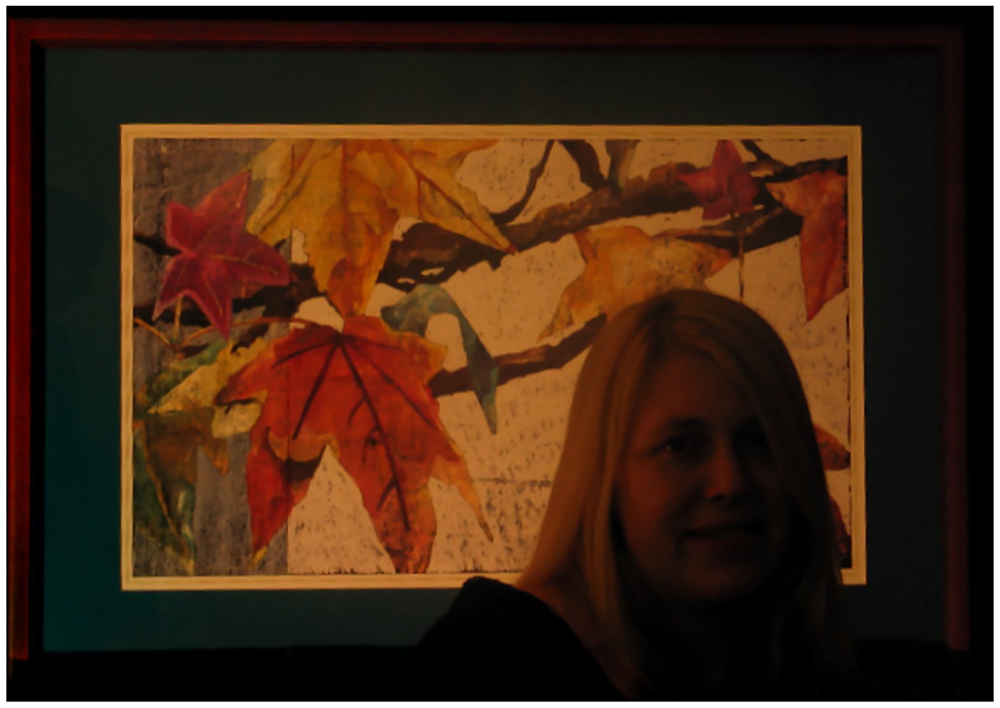

In [175]:
amb_museum_path = "./data/museum/museum_ambient.png"
flash_museum_path = "./data/museum/museum_flash.png"

img_am = np.asarray(io.imread(amb_museum_path))[:, :, 0:3]
img_am = img_am / 255.0
img_fl = np.asarray(io.imread(flash_museum_path))[:, :, 0:3]
img_fl = img_fl / 255.0

A = img_am


grad1 = get_gradient(A[:, :, 0]); grad2 = get_gradient(A[:, :, 1]); grad3 = get_gradient(A[:, :, 2])
D1 = divergence(grad1); D2 = divergence(grad2); D3 = divergence(grad3)
D = np.stack([D1, D2, D3], axis=2)

I_star_init = np.zeros_like(img_am)
I_star = poisson_solver(D, A, I_star_init)

plt.figure(figsize=(20,20))
plt.imshow(I_star)
plt.axis("off")
print((A - I_star).mean())
plt.savefig("poisson_check.png", bbox_inches='tight', pad_inches=0.0, dpi=200)

In [171]:
#Fused gradient fields

a = np.asarray(io.imread("data/museum/museum_ambient.png"))[:, :, 0:3]
a = a / 255.0
phi_dash = np.asarray(io.imread("data/museum/museum_flash.png"))[:, :, 0:3]
phi_dash = phi_dash / 255.0

sigma_fuse = 40
tau_s = 0.65

grad_a = img_gradient(a)#show########
grad_phi_dash = img_gradient(phi_dash) #show########
#step1
n1 = np.abs(np.sum(grad_a * grad_phi_dash, axis=0))
normalization1 = np.sqrt(np.sum(grad_a * grad_a, axis=0))
normalization2 = np.sqrt(np.sum(grad_phi_dash * grad_phi_dash, axis=0))
n2 = normalization1 * normalization2
M = n1 / n2
M = np.nan_to_num(M, copy=True, nan=0.0)

#step2
w_s = np.tanh(sigma_fuse* (phi_dash - tau_s))
w_s = (w_s-np.min(w_s))/(np.max(w_s)-np.min(w_s)) #Normalize

#step3
grad_phi_star_x = w_s * grad_a[0, :, :, :] + (1-w_s)*(M * grad_phi_dash[0, :, :, :] + (1 - M) * grad_a[0, :, :, :])
grad_phi_star_y = w_s * grad_a[1, :, :, :] + (1-w_s)*(M * grad_phi_dash[1, :, :, :] + (1 - M) * grad_a[1, :, :, :])

grad_phi_star = np.stack([grad_phi_star_x, grad_phi_star_y], axis=0)#show########

# grad1 = grad_phi_star[:, :, :, 0]; grad2 = grad_phi_star[:, :, :, 1]; grad3 = grad_phi_star[:, :, :, 2]
# D1 = divergence(grad1); D2 = divergence(grad2); D3 = divergence(grad3)

# divergence_phi_star = np.stack([D1, D2, D3], axis=2)
# #Initializations
# #phi_star_init = a #ambient image
# phi_star_init = phi_dash #flash image
# phi_star = poisson_solver(divergence_phi_star, a, phi_star_init)
# phi_star = phi_star - np.min(phi_star)/(np.max(phi_star)-np.min(phi_star))
# plt.figure(figsize=(20,20))
# plt.imshow(phi_star)
# plt.axis("off")
# plt.savefig("flash_ini_40_0.65.png", bbox_inches='tight', pad_inches=0.0, dpi=100)

/var/folders/_q/d0ww93zs26b5hx__yj4hc21r0000gn/T/ipykernel_49748/3525444895.py:18: RuntimeWarning: invalid value encountered in divide
  M = n1 / n2


In [172]:
grad_phi_star.shape

(2, 638, 905, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-2.411764705882353, 2.6470588235294117]. Convert image to uint8 prior to saving to suppress this warning.


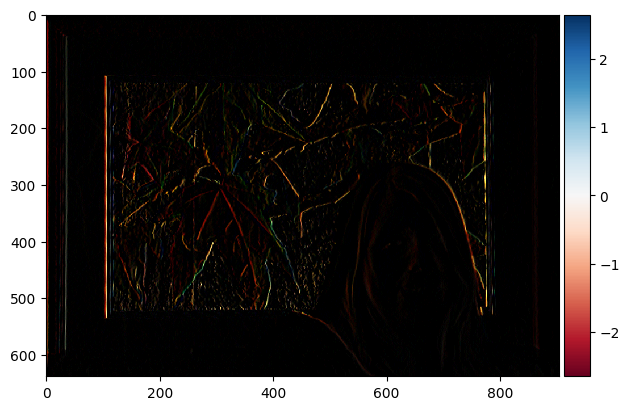

In [75]:
io.imshow(grad_a[0, :, :, :]*5)
io.imsave('data/museum/museum_grad_a0.jpeg', grad_a[0, :, :, :]*5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-1.9019607843137254, 2.411764705882353]. Convert image to uint8 prior to saving to suppress this warning.


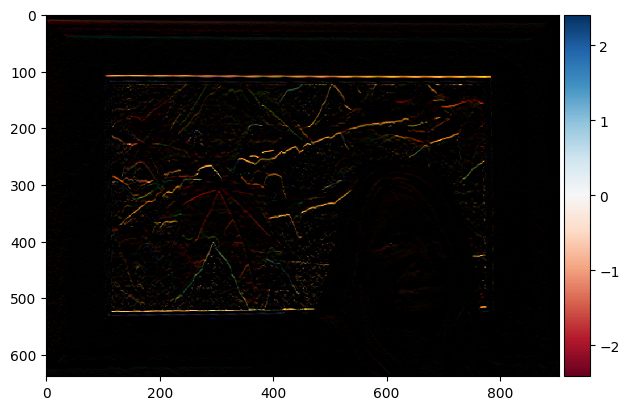

In [76]:
io.imshow(grad_a[1, :, :, :]*5)
io.imsave('data/museum/museum_grad_a1.jpeg', grad_a[1, :, :, :]*5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-2.0980392156862746, 2.411764705882353]. Convert image to uint8 prior to saving to suppress this warning.


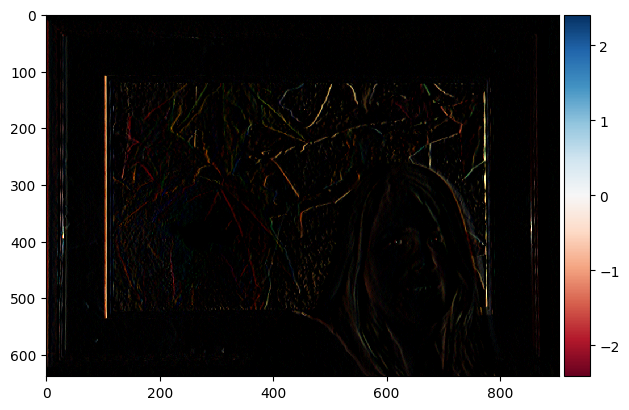

In [77]:
io.imshow(grad_phi_dash[0, :, :, :]*5)
io.imsave('data/museum/museum_grad_phi_dash0.jpeg', grad_phi_dash[0, :, :, :]*5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-1.7843137254901962, 2.2549019607843137]. Convert image to uint8 prior to saving to suppress this warning.


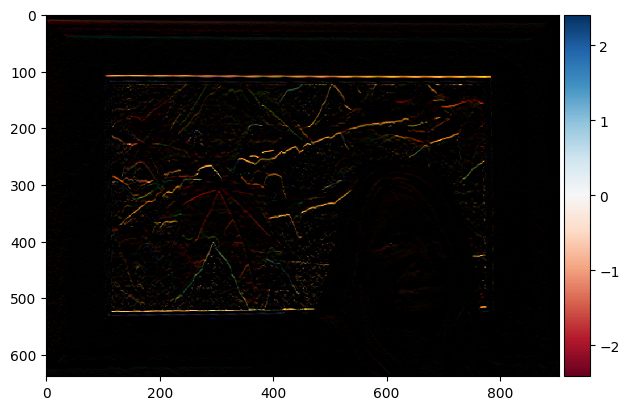

In [78]:
io.imshow(grad_a[1, :, :, :]*5)
io.imsave('data/museum/museum_grad_phi_dash1.jpeg', grad_phi_dash[1, :, :, :]*5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Lossy conversion from float64 to uint8. Range [-2.410497943193792, 1.8431372549009015]. Convert image to uint8 prior to saving to suppress this warning.


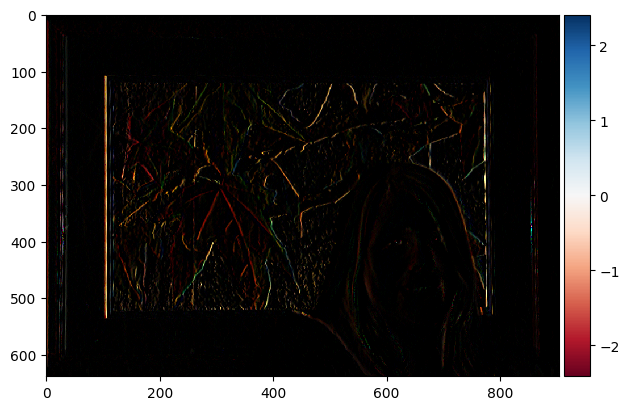

In [82]:
io.imshow(grad_phi_star[0, :, :, :]*5)
io.imsave('data/museum/museum_grad_phi_star0.jpeg', grad_phi_star[0, :, :, :]*5)


Iteration number 0
Current residual 98.09195358940072


Lossy conversion from float64 to uint8. Range [-0.42343528414329284, 1.226065954929097]. Convert image to uint8 prior to saving to suppress this warning.


Iteration number 1000
Current residual 0.055023227369925674


(-0.5, 2991.5, 1999.5, -0.5)

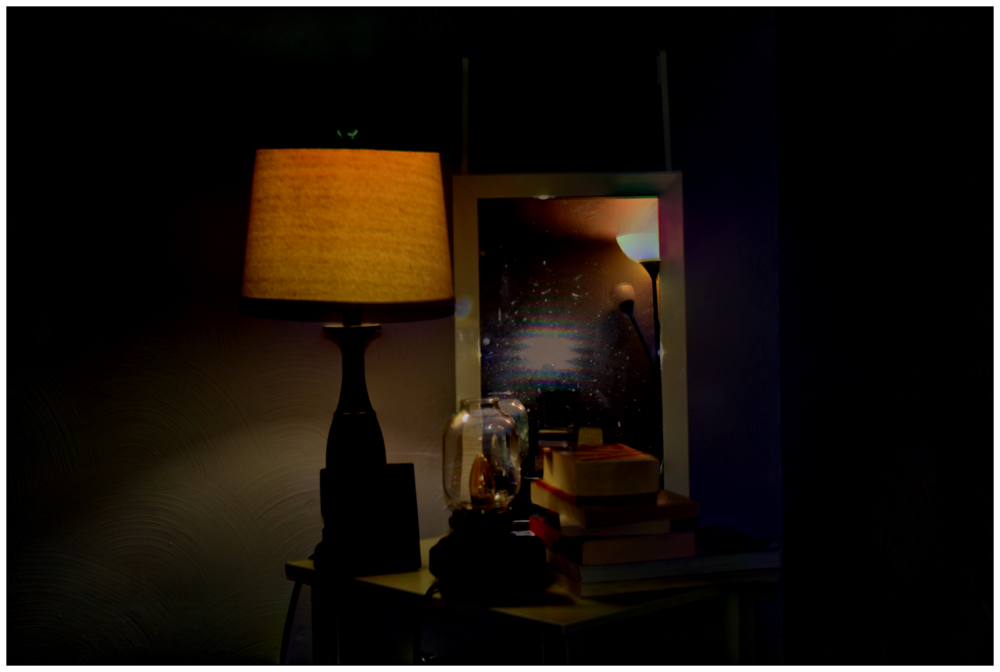

In [99]:
io.imsave('data/test2/test2_bilateral_joint.png', phi_star)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


(-0.5, 904.5, 637.5, -0.5)

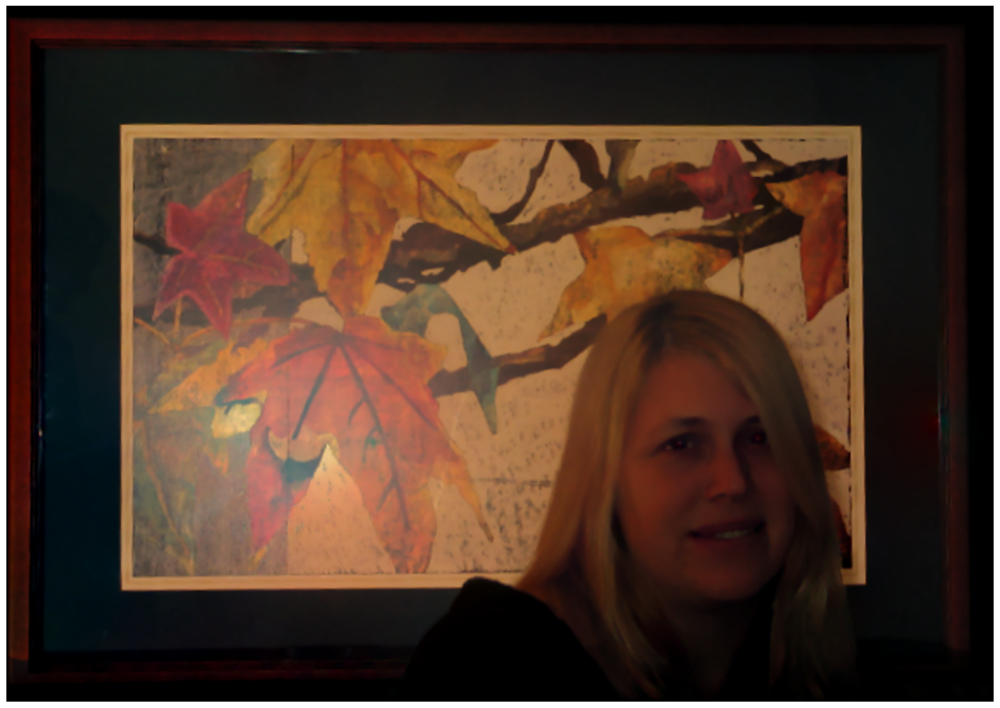

In [23]:

plt.figure(figsize=(20,20))
plt.imshow(phi_star)
plt.axis("off")

In [146]:
im1 = io.imread('data/test1/test_ambient.JPG')
im_am = (im1-im1.min())/(im1.max()-im1.min())
im2 = io.imread('data/test1/test_flash.JPG')
im_f = (im2-im2.min())/(im2.max()-im2.min())
im_masked, im_detail, M = masking(im_f, im_am)

(3, 2000, 2992, 3)
(5, 2000, 2992, 3)
(5, 2000, 2992, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


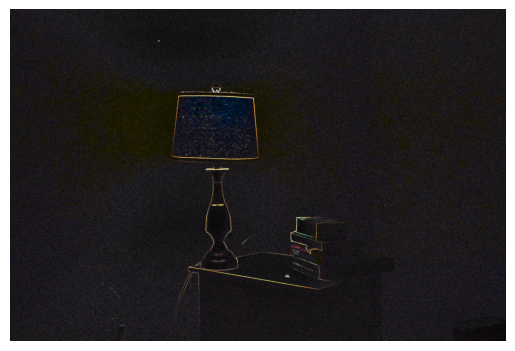

In [155]:
diff_dt = np.abs(im_masked-im_am)*15
plt.imshow(diff_dt)
plt.axis('off')
plt.savefig('data/lamp/lamp_detail_diff1.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


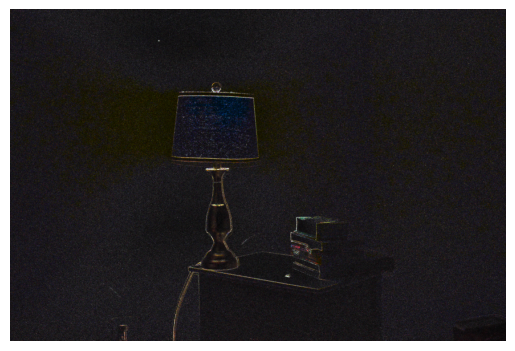

In [156]:
diff_dt = np.abs(im_detail-im_am)*15
plt.imshow(diff_dt)
plt.axis('off')
plt.savefig('data/lamp/lamp_masking_diff1.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

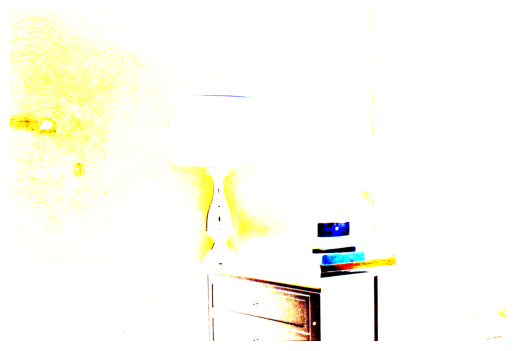

In [152]:
plt.imshow(M)
plt.axis('off')
plt.savefig('data/lamp/mask.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


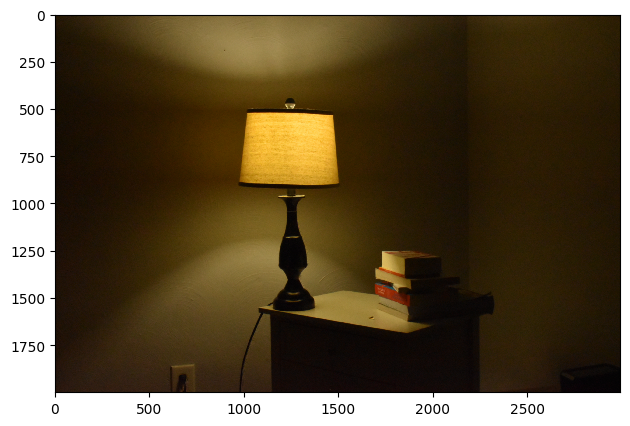

In [68]:
io.imshow(im_detail)
io.imsave('data/test1/test_detail.png', im_detail)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


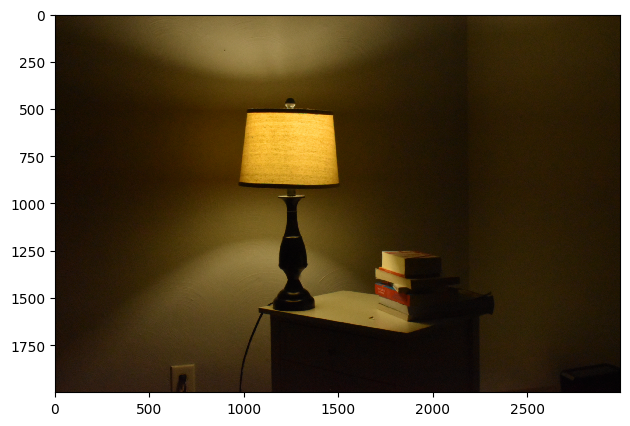

In [67]:
io.imshow(im_masked)
io.imsave('data/test1/test_masked.png', im_masked)

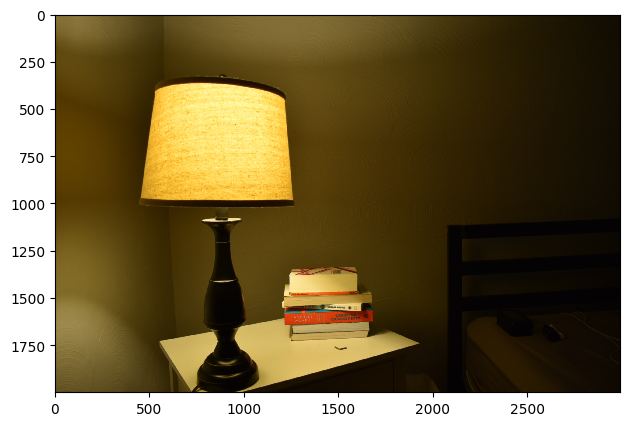

In [46]:

#io.imsave('data/test1/lamp_masked.png', im_masked)

(7, 2000, 2992, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


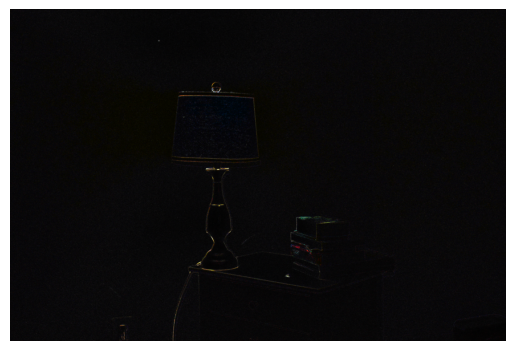

In [145]:
im1 = io.imread('data/test1/test_ambient.JPG')
im_am = (im1-im1.min())/(im1.max()-im1.min())
im2 = io.imread('data/test1/test_flash.JPG')
im_f = (im2-im2.min())/(im2.max()-im2.min())
out_jbf = bilateral_filter(im_am, im_f, sigma_range=0.15, sigma_spatial=1, gaussian_k=0)
#io.imshow(out_jbf)

#io.imsave('data/test1/test1_bjf1.png', out_jbf)

diff_dt = np.abs(im_am-out_jbf)*5
plt.imshow(diff_dt)
plt.axis('off')
plt.savefig('data/lamp/test_jbf_diff.png', bbox_inches='tight', pad_inches=0.0, dpi=200)

In [58]:
io.imsave('data/test1/test1_bjf1.png', out_jbf)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


/Users/richamishra/miniconda3/envs/CV/lib/python3.9/site-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


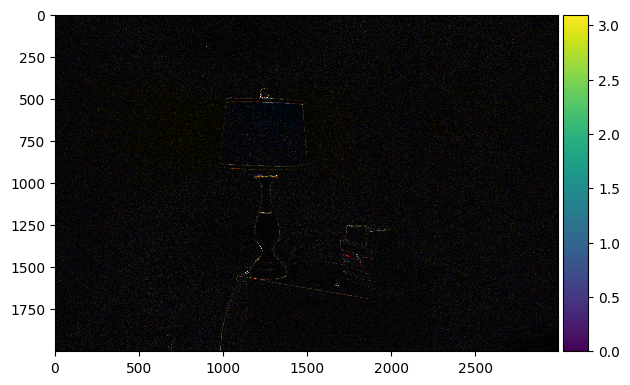

In [56]:
io.imshow((np.abs(out_jbf-im_am))*5)

/var/folders/_q/d0ww93zs26b5hx__yj4hc21r0000gn/T/ipykernel_49748/1382391018.py:18: RuntimeWarning: invalid value encountered in divide
  M = n1 / n2


Iteration number 0
Current residual 114.12247693277713


(-0.5, 2991.5, 1999.5, -0.5)

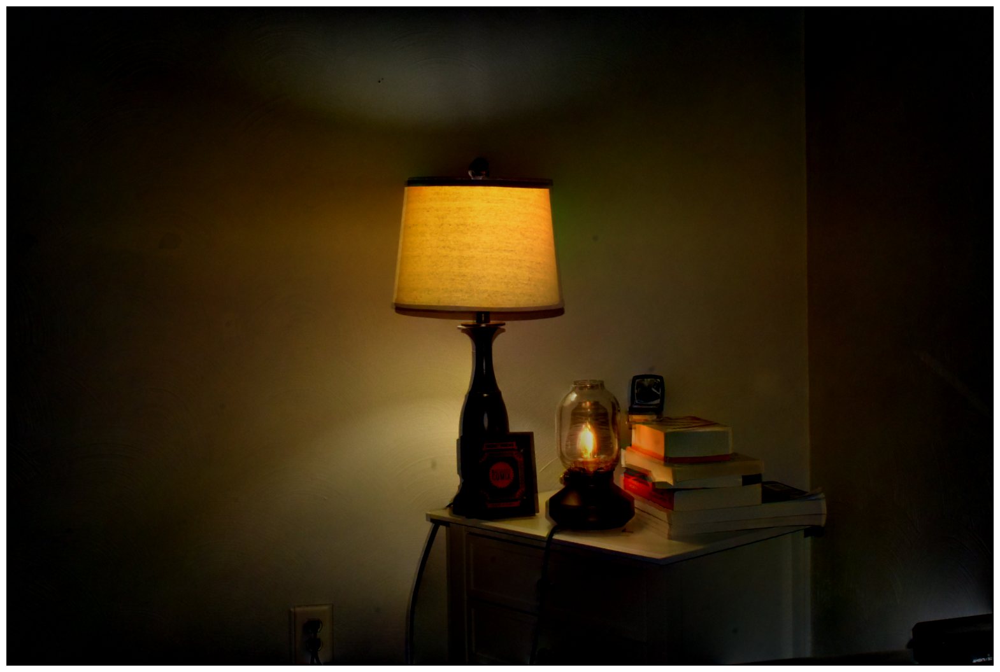

In [92]:
#Fused gradient fields

a = np.asarray(io.imread("data/test2/test_ambient.JPG"))[:, :, 0:3]
a = a / 255.0
phi_dash = np.asarray(io.imread("data/test2/test_flash.JPG"))[:, :, 0:3]
phi_dash = phi_dash / 255.0

sigma_fuse = 40
tau_s = 0.9

grad_a = img_gradient(a)#show########
grad_phi_dash = img_gradient(phi_dash) #show########
#step1
n1 = np.abs(np.sum(grad_a * grad_phi_dash, axis=0))
normalization1 = np.sqrt(np.sum(grad_a * grad_a, axis=0))
normalization2 = np.sqrt(np.sum(grad_phi_dash * grad_phi_dash, axis=0))
n2 = normalization1 * normalization2
M = n1 / n2
M = np.nan_to_num(M, copy=True, nan=0.0)

#step2
w_s = np.tanh(sigma_fuse* (phi_dash - tau_s))
w_s = (w_s-np.min(w_s))/(np.max(w_s)-np.min(w_s)) #Normalize

#step3
grad_phi_star_x = w_s * grad_a[0, :, :, :] + (1-w_s)*(M * grad_phi_dash[0, :, :, :] + (1 - M) * grad_a[0, :, :, :])
grad_phi_star_y = w_s * grad_a[1, :, :, :] + (1-w_s)*(M * grad_phi_dash[1, :, :, :] + (1 - M) * grad_a[1, :, :, :])

grad_phi_star = np.stack([grad_phi_star_x, grad_phi_star_y], axis=0)#show########

grad1 = grad_phi_star[:, :, :, 0]; grad2 = grad_phi_star[:, :, :, 1]; grad3 = grad_phi_star[:, :, :, 2]
D1 = divergence(grad1); D2 = divergence(grad2); D3 = divergence(grad3)

divergence_phi_star = np.stack([D1, D2, D3], axis=2)
#Initializations
phi_star_init = a #ambient image
#phi_star_init = phi_dash #flash image
phi_star = poisson_solver(divergence_phi_star, a, phi_star_init)
phi_star = phi_star - np.min(phi_star)/(np.max(phi_star)-np.min(phi_star))
plt.figure(figsize=(20,20))
plt.imshow(phi_star)
plt.axis("off")
#plt.savefig(r"bilateral_joint_flash_ini_40_0.9.png", bbox_inches='tight', pad_inches=0.0, dpi=100)

In [96]:
io.imsave("data/test2/bilateral_joint_flash_ini_1000.png", phi_star)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [144]:
channel = im[:, :, 0]
A_grad = gradient(channel)
A_div = divergence(A_grad)
A_lap = laplacian(channel)
A_div = A_div[1:-1, 1:-1]
A_lap = A_lap[1:-1, 1:-1]
diff = A_div - A_lap
print(np.sum(diff))

3.861216828227043e-05


In [149]:
lap = img_laplacian(im)[1:-1,1:-1,:]
div = img_divergence(im)[1:-1,1:-1,:]

In [150]:
np.sum(lap - div)

-0.0009155352599918842

In [5]:
sigma_range = 0.1 #0.05-0.25
sigma_spatial = 5 #1-64
lambda1 = 1e-1
minI = min(im2.flatten()-lambda1)
maxI = max(im2.flatten()+lambda1)
nb_seg = np.ceil((maxI - minI)/sigma_range)
print(nb_seg)

13.0


Bonus 4 question

In [188]:
a = np.asarray(io.imread("data/test4/ambient.JPG"))[:, :, 0:3]
a = a / 255.0
phi_dash = np.asarray(io.imread("data/test4/flash.JPG"))[:, :, 0:3]
phi_dash = phi_dash / 255.0

H = a+phi_dash

sigma_fuse = 40
tau_s = 0.1

grad_a = img_gradient(a)#show########
grad_H = img_gradient(H) #show########
#step1
n1 = grad_a*np.sum(grad_a*grad_H, axis=0)
n2 = np.sqrt(np.sum(grad_a * grad_H, axis=0))
M = n1/n2
#print(M.shape, n1.shape, n2.shape, grad_H.shape)
#step2
w_s = 1-np.tanh(sigma_fuse*(phi_dash - tau_s))
w_s = (w_s-np.min(w_s))/(np.max(w_s)-np.min(w_s)) #Normalize

#step3
grad_phi_star_x = w_s * grad_H[0, :, :, :] + (1-w_s)*M[0,:,:,:]#(M * grad_phi_dash[0, :, :, :] + (1 - M) * grad_a[0, :, :, :])
grad_phi_star_y = w_s * grad_H[1, :, :, :] + (1-w_s)*M[1,:,:,:]#(M * grad_phi_dash[1, :, :, :] + (1 - M) * grad_a[1, :, :, :])

grad_phi_star = np.stack([grad_phi_star_x, grad_phi_star_y], axis=0)#show########

/var/folders/_q/d0ww93zs26b5hx__yj4hc21r0000gn/T/ipykernel_49748/646177688.py:15: RuntimeWarning: invalid value encountered in sqrt
  n2 = np.sqrt(np.sum(grad_a * grad_H, axis=0))
/var/folders/_q/d0ww93zs26b5hx__yj4hc21r0000gn/T/ipykernel_49748/646177688.py:16: RuntimeWarning: invalid value encountered in divide
  M = n1/n2


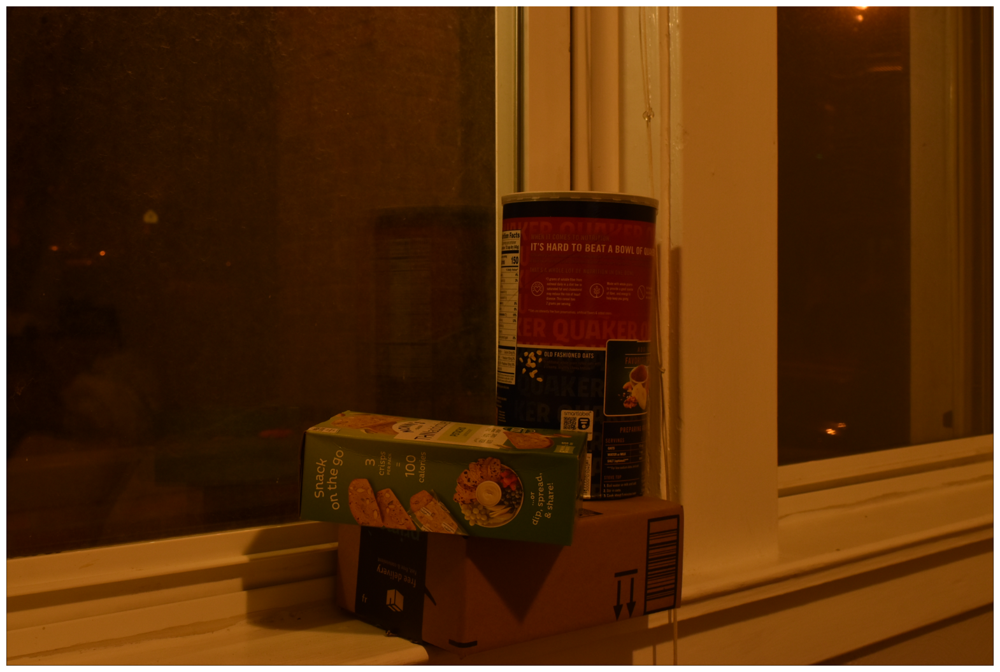

In [189]:
grad1 = grad_phi_star[:, :, :, 0]; grad2 = grad_phi_star[:, :, :, 1]; grad3 = grad_phi_star[:, :, :, 2]
D1 = divergence(grad1); D2 = divergence(grad2); D3 = divergence(grad3)

divergence_phi_star = np.stack([D1, D2, D3], axis=2)
#Initializations
phi_star_init = a #ambient image
#phi_star_init = phi_dash #flash image
phi_star = poisson_solver(divergence_phi_star, a, phi_star_init)
phi_star = phi_star - np.min(phi_star)/(np.max(phi_star)-np.min(phi_star))
plt.figure(figsize=(20,20))
plt.imshow(phi_star)
plt.axis("off")
plt.savefig("data/test4/bonus.png", bbox_inches='tight', pad_inches=0.0, dpi=100)